<h2 align="center">Image Compression with K-means Clustering</h2>

### Importing Libraries
---

In [2]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as image
plt.style.use("ggplot")

from skimage import io
from sklearn.cluster import KMeans

from ipywidgets import interact, interactive, fixed, interact_manual, IntSlider
import ipywidgets as widgets

In [29]:
plt.rcParams['figure.figsize'] = (20, 10)

### Data Preprocessing 
---

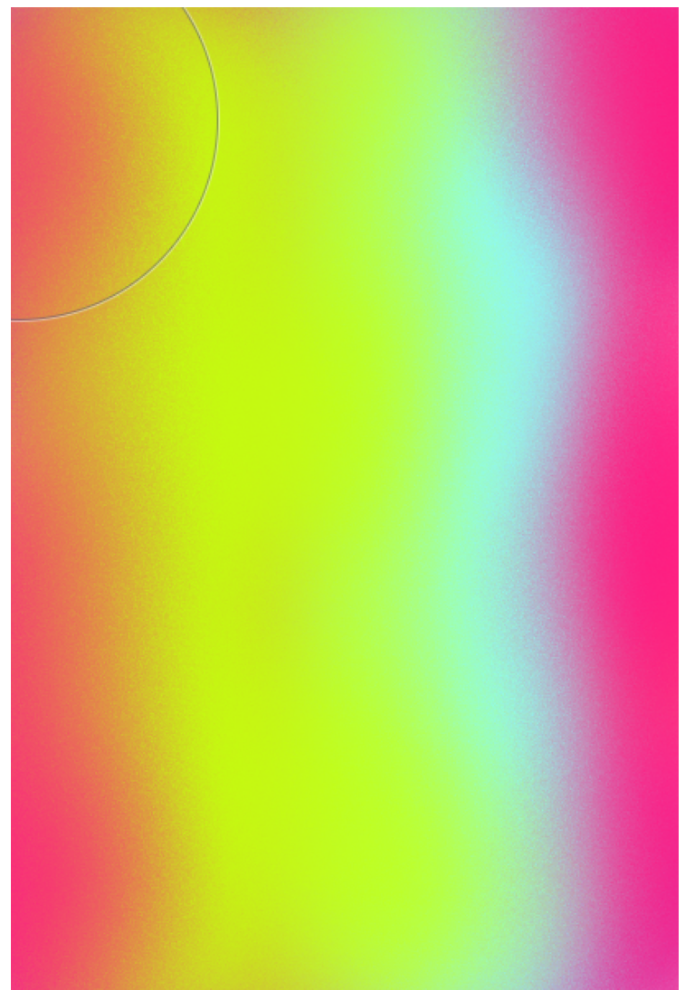

In [5]:
img = io.imread('images/onecol.png')
ax = plt.axes(xticks=[], yticks=[])
ax.imshow(img);

In [6]:
img.shape

(600, 408, 3)

In [8]:
img_data = (img / 255.0).reshape(-1, 3) # .reshape(-1, 3)
img_data.shape

(244800, 3)

###  Visualizing the Color Space using Point Clouds for 16777216 (256 x 256 x 256 ) colors
---

In [20]:
from plot_utils import plot_utils

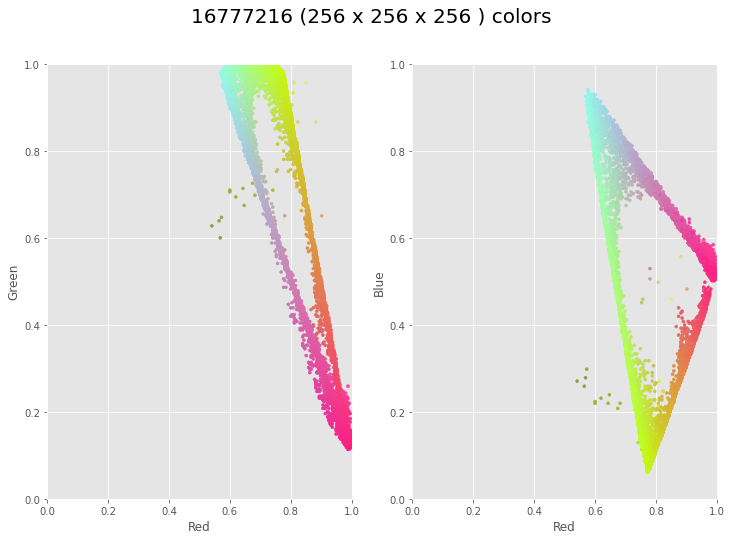

In [21]:
x = plot_utils(img_data,title="16777216 (256 x 256 x 256 ) colors")
x.colorSpace()

In [ ]:
###  Visualizing the Color Space using Point Clouds for 16777216 (256 x 256 x 256 ) colors
---

In [23]:
from sklearn.cluster import MiniBatchKMeans

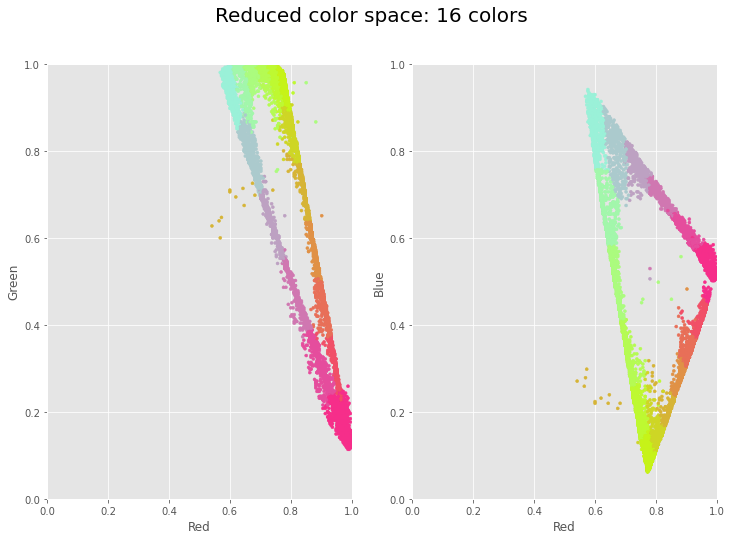

In [24]:
kmeans = MiniBatchKMeans(16).fit(img_data)
k_colors = kmeans.cluster_centers_[kmeans.predict(img_data)]

y = plot_utils(img_data, colors=k_colors, title="Reduced color space: 16 colors")
y.colorSpace()

### K-means Image Compression with Interactive Controls
---

In [26]:
img_dir = 'images/'

In [30]:
@interact
def color_compression(image=os.listdir(img_dir), k=IntSlider(min=1,max=256,step=1,value=16,
                                                             continuous_update=True,
                                                             layout=dict(width='100%'))):
    
    input_img = io.imread(img_dir + image)
    img_data = (input_img / 255.0).reshape(-1, 3)
    
    kmeans = MiniBatchKMeans(k).fit(img_data)
    k_colors = kmeans.cluster_centers_[kmeans.predict(img_data)]

    k_img = np.reshape(k_colors, (input_img.shape))
    
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.suptitle('K-means Image Compression', fontsize=20)
    
    ax1.set_title('Compressed')
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.imshow(k_img)
    
    ax2.set_title('Original (16,777,216 colors)')
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.imshow(input_img)
    
    plt.subplots_adjust(top=0.85)
    plt.show()

interactive(children=(Dropdown(description='image', options=('five.jpg', 'four.jpg', 'onecol.png', 'three.png'…